<a href="https://colab.research.google.com/github/RavivKerner/test/blob/New-branch/Copy_of_Copy_of_02_production_with_tanks.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()
from fastbook import *
from fastai.vision.widgets import *

     |████████████████████████████████| 720 kB 5.5 MB/s 
     |████████████████████████████████| 46 kB 3.6 MB/s 
     |████████████████████████████████| 1.2 MB 31.9 MB/s 
     |████████████████████████████████| 189 kB 35.7 MB/s 
     |████████████████████████████████| 56 kB 4.4 MB/s 
     |████████████████████████████████| 51 kB 316 kB/s 
Mounted at /content/gdrive


# Tank classifier

## Download imges for training

In [2]:
#seting search vars
tank_types = 'merkava mk4','M1 Abrams','water'
path = Path('tanks')

In [3]:
#downloading 150 images to labeled directories
if not path.exists():
    path.mkdir()
    for o in tank_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        urls = search_images_ddg(f'{o} tank', max_images=150)
        download_images(dest, urls=urls)

In [4]:
#deleting not working files
fns = get_image_files(path)
failed = verify_images(fns)
failed.map(Path.unlink);


## Preparing the data to the model

In [23]:
tanks = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())

In [24]:
dls = tanks.dataloaders(path)

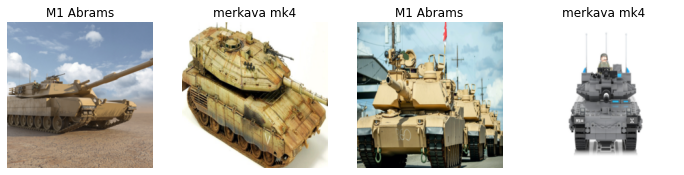

In [25]:
dls.valid.show_batch(max_n=4, nrows=1)

### Data Augmentation

## Training the model and clean the data

In [26]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.493091,0.606669,0.219048,00:23


/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


epoch,train_loss,valid_loss,error_rate,time
0,0.391808,0.347259,0.114286,00:23
1,0.321919,0.219891,0.066667,00:23
2,0.243915,0.209077,0.057143,00:23
3,0.193502,0.206614,0.057143,00:22


/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency e

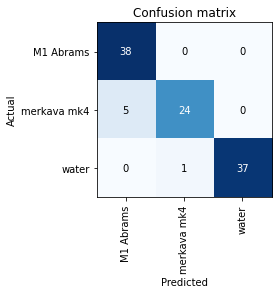

In [27]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

In [10]:
def plot_top_losses_fix(interp, k, largest=True, **kwargs):
        losses,idx = interp.top_losses(k, largest)
        if not isinstance(interp.inputs, tuple): interp.inputs = (interp.inputs,)
        if isinstance(interp.inputs[0], Tensor): inps = tuple(o[idx] for o in interp.inputs)
        else: inps = interp.dl.create_batch(interp.dl.before_batch([tuple(o[i] for o in interp.inputs) for i in idx]))
        b = inps + tuple(o[idx] for o in (interp.targs if is_listy(interp.targs) else (interp.targs,)))
        x,y,its = interp.dl._pre_show_batch(b, max_n=k)
        b_out = inps + tuple(o[idx] for o in (interp.decoded if is_listy(interp.decoded) else (interp.decoded,)))
        x1,y1,outs = interp.dl._pre_show_batch(b_out, max_n=k)
        if its is not None:
            #plot_top_losses(x, y, its, outs.itemgot(slice(len(inps), None)), L(self.preds).itemgot(idx), losses,  **kwargs)
            plot_top_losses(x, y, its, outs.itemgot(slice(len(inps), None)), interp.preds[idx], losses,  **kwargs)
        #TODO: figure out if this is needed
        #its None means that a batch knows how to show itself as a whole, so we pass x, x1
        #else: show_results(x, x1, its, ctxs=ctxs, max_n=max_n, **kwargs)

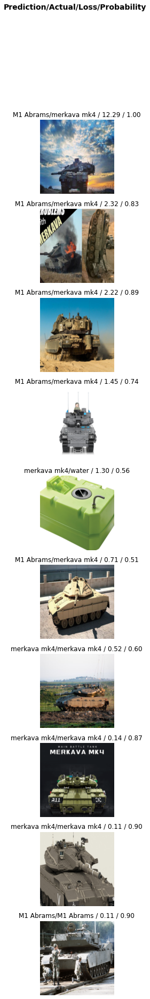

In [42]:
plot_top_losses_fix(interp, 10, nrows=10)

In [20]:
#hide_output
cleaner = ImageClassifierCleaner(learn)
cleaner

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


In [ ]:
# for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat/)

In [13]:
for idx, cat in cleaner.change():
  f = cleaner.fns[idx]
  os.rename(f, f.parent/(f.parent.name+f.stem+f.suffix))
  shutil.move(str(f.parent/(f.parent.name+f.stem+f.suffix)), path/cat )

In [22]:
#hide
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
# for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

## POC with user interface

### Using the Model for Inference

In [29]:
learn.export()

In [ ]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [ ]:
learn_inf = load_learner(path/'export.pkl')

In [ ]:
learn_inf.predict('/content/DSC01005.JPG') #return predicting category, index and probabilities based on vocab

('merkava mk4',
 TensorBase(1),
 TensorBase([3.5945e-02, 9.6391e-01, 1.4220e-04]))

In [ ]:
learn_inf.dls.vocab

['M1 Abrams', 'merkava mk4', 'water']

Making multi label classifier on the same data


In [33]:
tanks = DataBlock(
    blocks=(ImageBlock, MultiCategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())

In [34]:
dls = tanks.dataloaders(path)

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


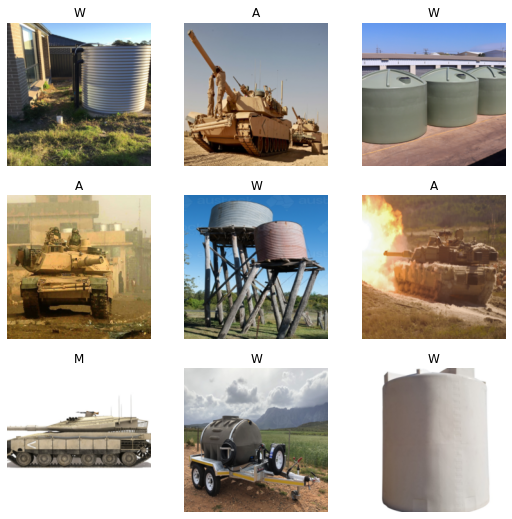

In [35]:
dls.valid.show_batch()

In [40]:
learnerm =cnn_learner(dls, resnet18, metrics=partial(accuracy_multi, thresh=0.2))

In [57]:
lr = cnn_learner(dls, resnet18, loss_func=F.binary_cross_entropy_with_logits, metrics=partial(accuracy_multi, thresh=0.2) )

In [58]:
lr.fine_tune(4)

epoch,train_loss,valid_loss,accuracy_multi,time
0,0.917494,0.548670,0.688889,00:23


/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


epoch,train_loss,valid_loss,accuracy_multi,time
0,0.453487,0.319422,0.739683,00:23
1,0.387624,0.198448,0.857143,00:23
2,0.313790,0.133098,0.904762,00:22
3,0.261965,0.113522,0.911111,00:23


/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency e

In [41]:
learnerm.fine_tune(4)

epoch,train_loss,valid_loss,accuracy_multi,time
0,0.841368,0.577914,0.720635,00:22


/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


epoch,train_loss,valid_loss,accuracy_multi,time
0,0.441434,0.289266,0.771429,00:23
1,0.343180,0.162667,0.898413,00:23
2,0.274109,0.144714,0.923810,00:23
3,0.229381,0.132183,0.930159,00:23


/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency e

In [43]:
interp = ClassificationInterpretation.from_learner(learnerm)

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


,target,predicted,probabilities,loss
0,M,A,"TensorBase([0.9928, 0.2032, 0.0035])",2.1789371967315674
1,M,A;M,"TensorBase([9.9425e-01, 7.8823e-01, 5.5055e-04])",1.7992465496063232
2,M,A;M,"TensorBase([0.9914, 0.7239, 0.0041])",1.6961650848388672
3,M,A;M,"TensorBase([0.9256, 0.8445, 0.0123])",0.9267608523368835
4,M,,"TensorBase([0.3032, 0.1503, 0.0161])",0.7575526237487793
5,W,M;W,"TensorBase([0.1878, 0.7525, 0.5177])",0.7543134093284607
6,W,M;W,"TensorBase([0.0121, 0.8932, 0.9962])",0.750869870185852
7,M,A;M,"TensorBase([0.6881, 0.7610, 0.0283])",0.48896878957748413
8,M,A;M,"TensorBase([7.4197e-01, 9.0489e-01, 4.1376e-04])",0.48500630259513855
9,M,A;M,"TensorBase([6.7853e-01, 9.9393e-01, 5.0326e-04])",0.38048088550567627


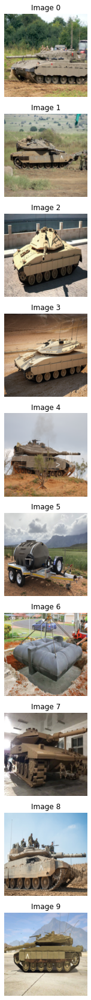

In [44]:
plot_top_losses_fix(interp, 10, nrows=10)

In [59]:
interp = ClassificationInterpretation.from_learner(lr)

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


,target,predicted,probabilities,loss
0,W,,"TensorMultiCategory([1.7357, 0.0586, 0.9514])",0.9825026988983154
1,M,,"TensorMultiCategory([ 1.8960, 0.0158, -4.7745])",0.9098753929138184
2,W,,"TensorMultiCategory([-4.7633, 2.3704, 1.9817])",0.8657727241516113
3,M,,"TensorMultiCategory([-2.4601, 0.7044, 1.9462])",0.8544666171073914
4,M,,"TensorMultiCategory([ 1.8451, 3.1319, -6.5434])",0.6786462068557739
5,A,,"TensorMultiCategory([ 3.0964, 1.6616, -7.4819])",0.6267192363739014
6,M,,"TensorMultiCategory([ 1.1819, 0.6833, -4.9207])",0.621819257736206
7,M,,"TensorMultiCategory([ 0.8447, 0.8438, -3.4673])",0.5302155017852783
8,M,,"TensorMultiCategory([ 1.1352, 3.1694, -9.3614])",0.4850361943244934
9,M,,"TensorMultiCategory([ 1.0769, 3.5374, -6.0820])",0.46701520681381226


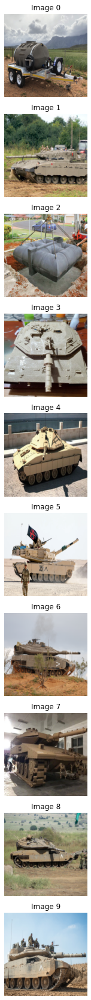

In [60]:
plot_top_losses_fix(interp, 10, nrows=10)

In [45]:
learnerm.export(fname='multi.pkl')

### Simple UI demo

In [ ]:
#To use our model in an application, we can simply treat the predict method as a regular function. 

In [46]:
#loading the model (Arch+parameters)
path = Path()
learn_inf = load_learner(path/'multi.pkl')

In [47]:
btn_upload = widgets.FileUpload()
out_pl = widgets.Output()
lbl_pred = widgets.Label()
btn_run = widgets.Button(description='Classify')

In [48]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [49]:
#hide_output
VBox([widgets.Label('Select your tank!'), 
      btn_upload, btn_run, out_pl, lbl_pred])

TypeError: ignored

In [10]:
print("hello world")

hello world


In [50]:
learnerm.predict('/content/TetroWtank.jpg')

((#1) ['W'],
 TensorBase([False, False,  True]),
 TensorBase([0.0503, 0.1906, 0.9883]))

In [51]:
learnerm.predict('/content/DUDU.jpg')

((#1) ['M'],
 TensorBase([False,  True, False]),
 TensorBase([0.0066, 0.8437, 0.3313]))

In [52]:
learnerm.predict('/content/manytanks.jpg')

((#2) ['M','W'],
 TensorBase([False,  True,  True]),
 TensorBase([0.0011, 0.8832, 0.8857]))

In [53]:
learnerm.predict('/content/merk_abrms2.jpeg')

((#1) ['M'],
 TensorBase([False,  True, False]),
 TensorBase([0.3601, 0.9252, 0.0221]))

In [54]:
learnerm.predict('/content/merkav_abrams.jpg')

((#1) ['A'],
 TensorBase([ True, False, False]),
 TensorBase([0.9907, 0.4076, 0.0100]))

In [55]:
learnerm.predict('/content/mek_abs_3.jpg')

((#1) ['A'],
 TensorBase([ True, False, False]),
 TensorBase([0.9726, 0.2548, 0.0065]))

In [56]:
learnerm.predict('/content/127.JPG')

((#1) ['W'],
 TensorBase([False, False,  True]),
 TensorBase([0.0385, 0.2723, 0.9933]))

In [67]:
a, b, c = lr.predict('/content/merk_abrms2.jpeg')
c.sigmoid()

TensorBase([0.2893, 0.9868, 0.0014])

In [64]:
c.sigmoid()

TensorBase([0.0173, 0.3211, 0.8698])